In [1]:
import os
import sys
import numpy as np
import pandas as pd
from pathlib import Path

# 현재 노트북이 있는 경로 기준으로 프로젝트 루트(recsys) 경로 계산
current_dir = (
    os.path.dirname(os.path.abspath(__file__))
    if "__file__" in globals()
    else os.getcwd()
)
project_root = os.path.abspath(os.path.join(current_dir, ".."))

# recsys 폴더를 sys.path에 추가
if project_root not in sys.path:
    sys.path.append(project_root)

from setup_env import setup_env

root_dir = setup_env()

from utils.dataset.config import DatasetPath
from utils.dataset.plot import show_items
from utils.retriever.ann import build_index, search
from utils.serving.artifact import register_artifact_model

[INFO] Font applied: NanumGothic


# Load Dataset

In [2]:
# 데이터셋 경로
dataset_dir = Path(root_dir).joinpath("data/dataset")
paths = DatasetPath(root_dir=dataset_dir, dataset_name="fashion")

df_user_logs = pd.read_parquet(paths.user_logs_path)
df_item = pd.read_parquet(paths.item_metadata_path)

# Load Embedding Vectors

In [3]:
# 벡터 저장 경로 설정 (`root_dir` 아래에 도메인별 LightGCN 결과물이 저장된 폴더 지정)
vector_path = Path(root_dir).joinpath("data/outputs/fashion/lightgcn")

# User / Item 벡터 파일 로드
df_user_vectors = pd.read_parquet(vector_path.joinpath("user_vector.parquet"))
df_item_vectors = pd.read_parquet(vector_path.joinpath("item_vector.parquet"))

# ID 매핑 딕셔너리 생성 (ANN 검색 후 결과를 실제 ID로 변환할 때 필요)
user_id_maps = dict(zip(df_user_vectors["idx"], df_user_vectors["user_id"]))
item_id_maps = dict(zip(df_item_vectors["idx"], df_item_vectors["item_id"]))

# 벡터(Numpy 배열) 변환
user_vectors = np.array(df_user_vectors["vector_normalized"].tolist())
item_vectors = np.array(df_item_vectors["vector_normalized"].tolist())

# 데이터 타입 변환 (ANN 라이브러리에서 효율적으로 사용하기 위해 float32로 맞춤)
user_vectors = np.array(user_vectors).astype(np.float32)
item_vectors = np.array(item_vectors).astype(np.float32)

# Vector Similarity Search

## User Similarity

In [4]:
# 유저 벡터 ANN 인덱스 생성
user_index = build_index(
    vectors=user_vectors, save_path=vector_path.joinpath("user_index.bin")
)

# 질의할 유저 선택
user_idx = 0
query_vector = user_vectors[user_idx]  # 해당 유저의 임베딩 벡터

# ANN 검색 실행 (`query_vector`와 가장 가까운 Top-5 유저 탐색)
result = search(query_vector, user_index, top_k=5)
print(result)  # 예: {1: 0.9, 2: 0.8, ...}

{0: 1.0, 9206: 0.5284624695777893, 2860: 0.4678482413291931, 6261: 0.45344769954681396, 8762: 0.4510294198989868}


User ID: 1
-----------------------------------


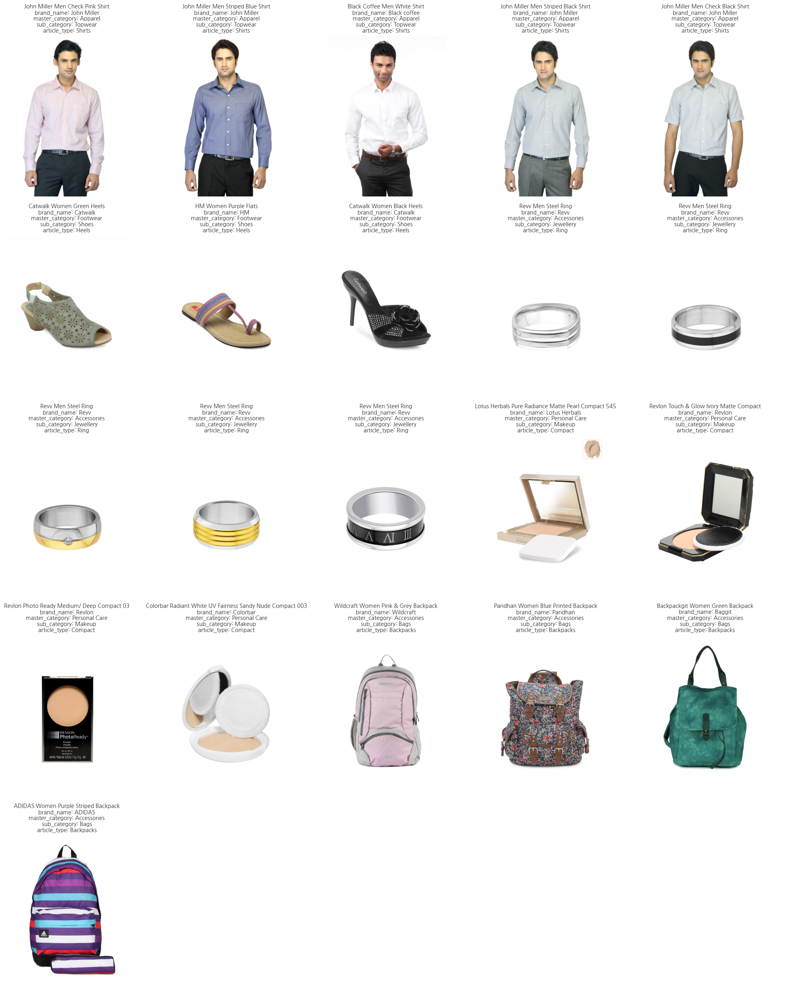

In [5]:
# 질의 유저의 히스토리 조회 (어떤 아이템들에 관심이 있었는지)
user_id = user_id_maps[user_idx]

print(f"User ID: {user_id}")
print("-----------------------------------")
item_ids = df_user_logs[df_user_logs["user_id"] == user_id]["item_id"].tolist()

show_items(
    item_ids=item_ids, df_item=df_item, image_dir=paths.dataset_dir.joinpath("images")
)


User ID: 9207
-----------------------------------


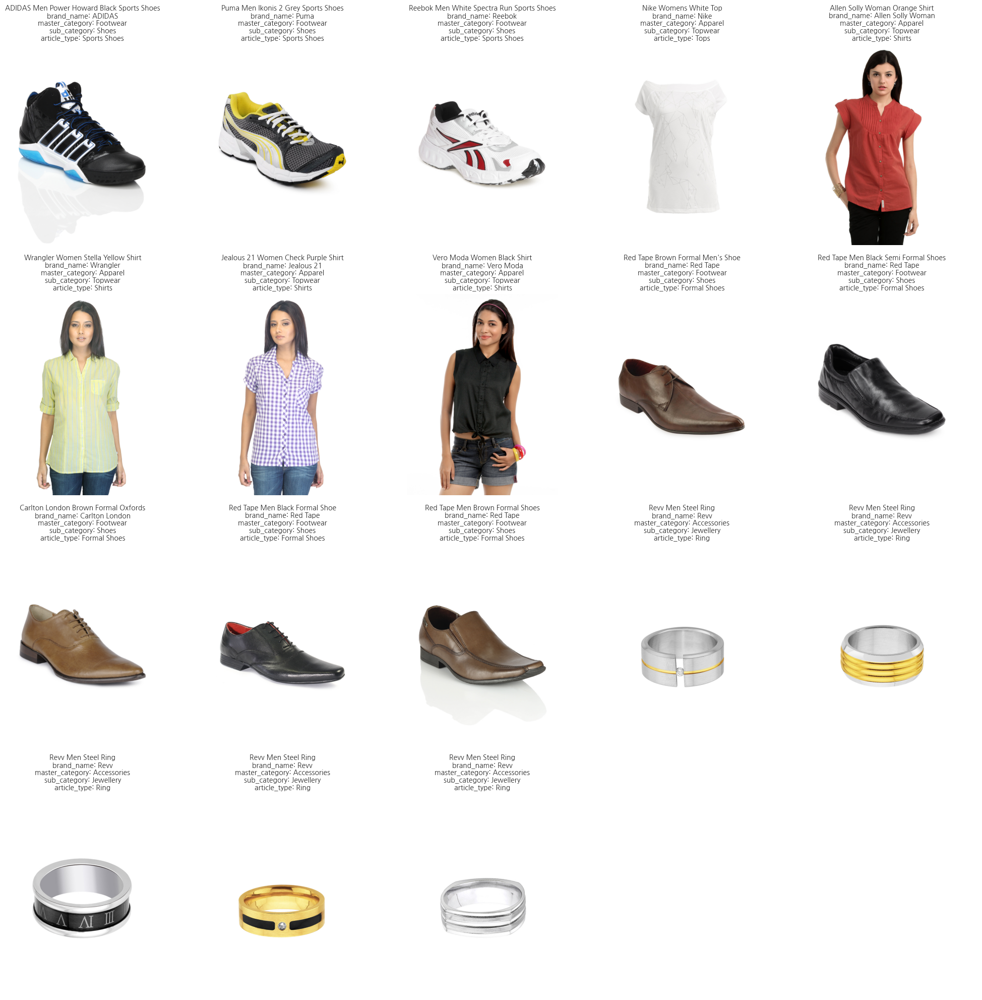


User ID: 2861
-----------------------------------


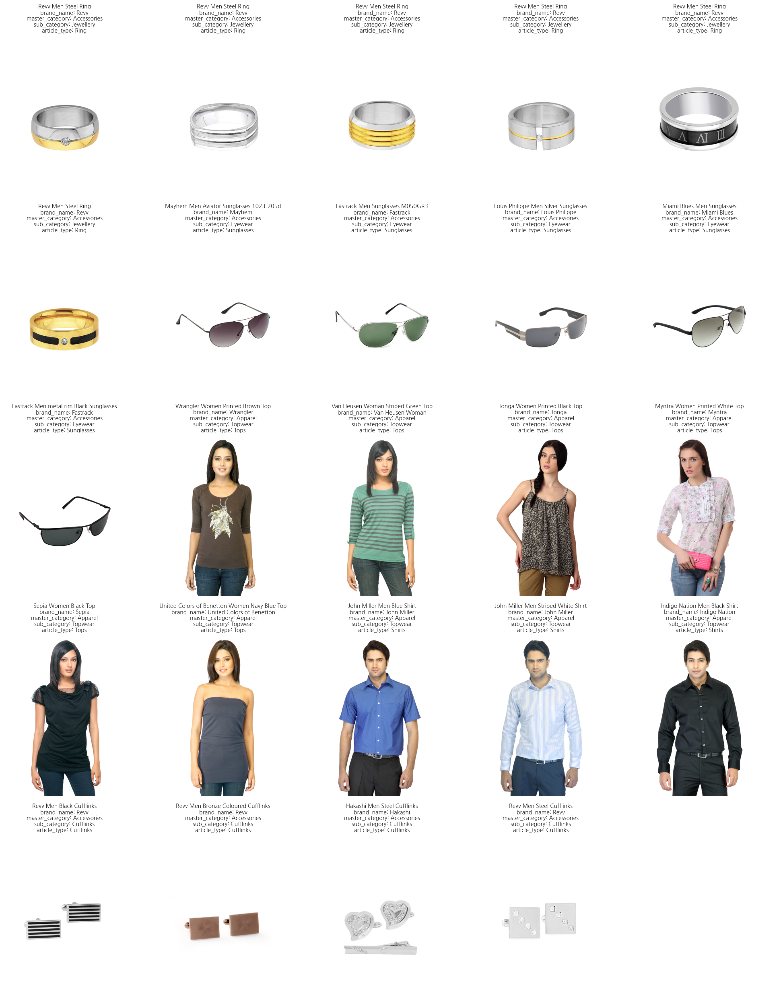


User ID: 6262
-----------------------------------


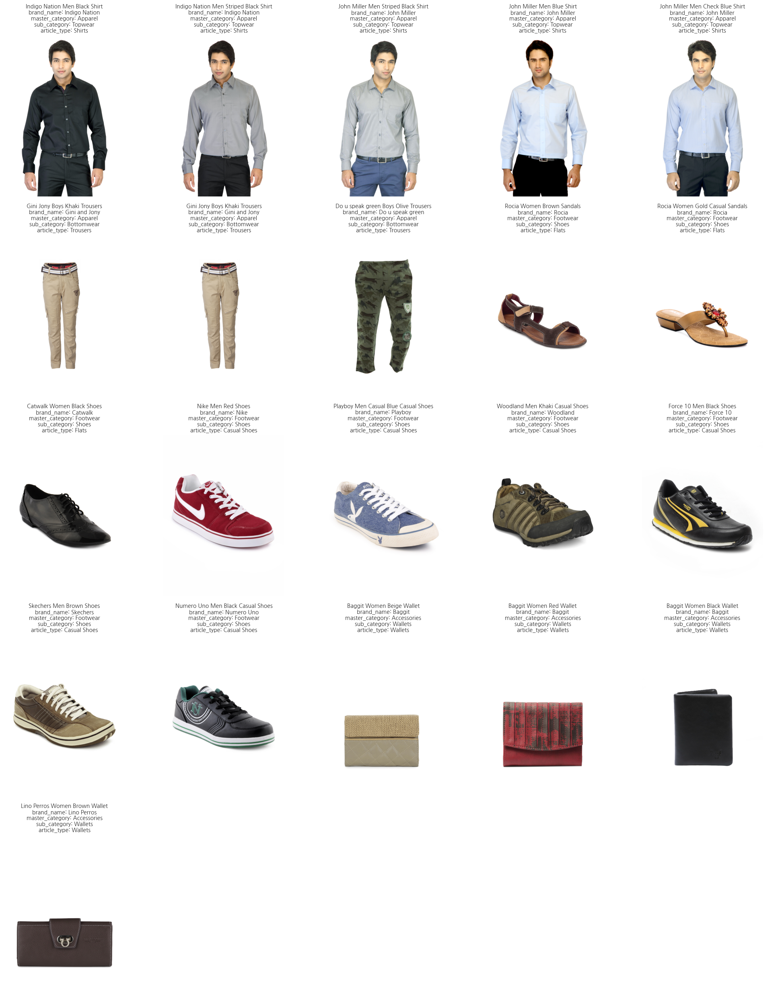


User ID: 8763
-----------------------------------


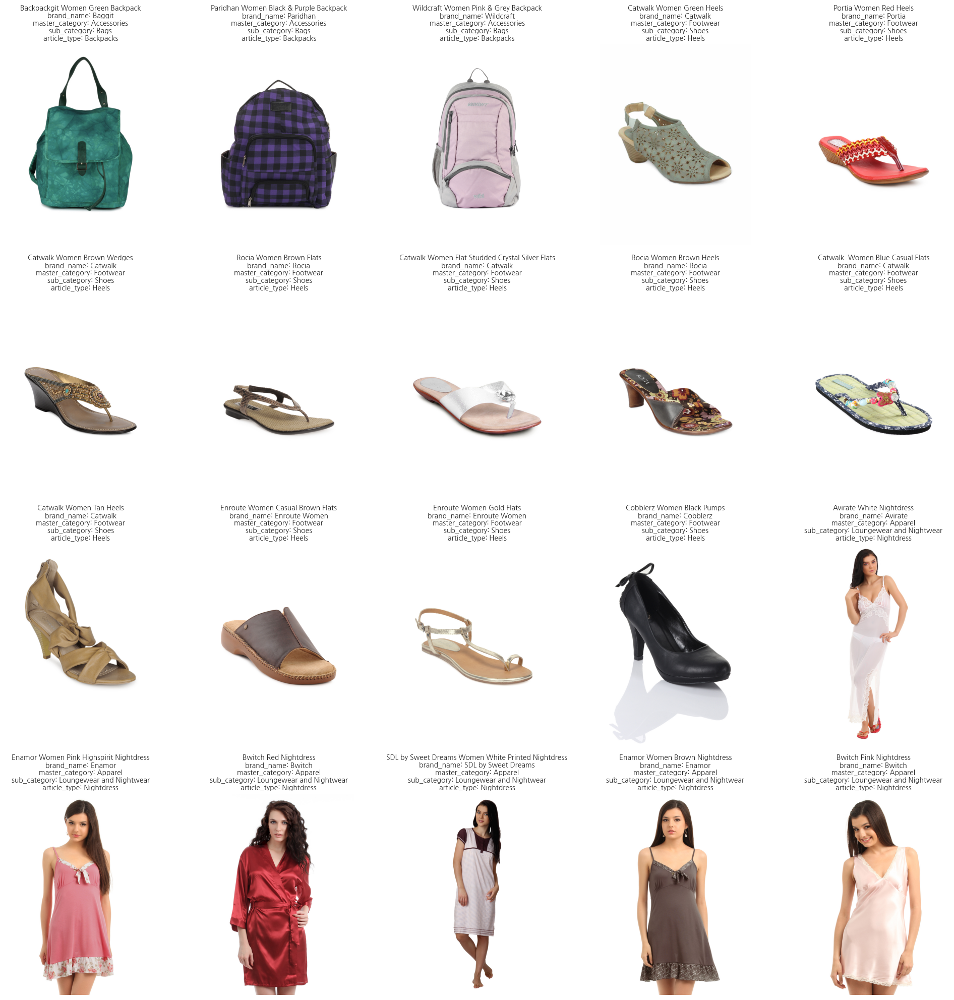

In [6]:
# 유사 유저의 히스토리 조회 (어떤 아이템들에 관심이 있었는지)
similar_indies = list(result.keys())[1:]  # 첫 번째는 자기 자신과의 유사도이므로 제외
similar_user_ids = [user_id_maps[i] for i in similar_indies]

for uid in similar_user_ids:
    print(f"\nUser ID: {uid}")
    print("-----------------------------------")
    show_items(
        item_ids=df_user_logs[df_user_logs["user_id"] == uid]["item_id"].tolist(),
        df_item=df_item,
        image_dir=paths.dataset_dir.joinpath("images"),
    )

## Item Similarity

In [7]:
# 아이템 벡터 ANN 인덱스 생성
item_index = build_index(
    vectors=item_vectors, save_path=vector_path.joinpath("item_index.bin")
)


# 질의할 아이템 선택
item_idx = 1
query_vector = item_vectors[item_idx]  # 해당 아이템의 임베딩 벡터

# ANN 검색 실행 (`query_vector`와 가장 가까운 Top-5 아이템 탐색)
result = search(query_vector, item_index, top_k=5)
print(result)  # 예: {1: 0.9, 2: 0.8, ...}

{1: 0.9999998807907104, 4608: 0.692185640335083, 7654: 0.6768584251403809, 7619: 0.6728044748306274, 251: 0.6667892336845398}


Item ID: 2


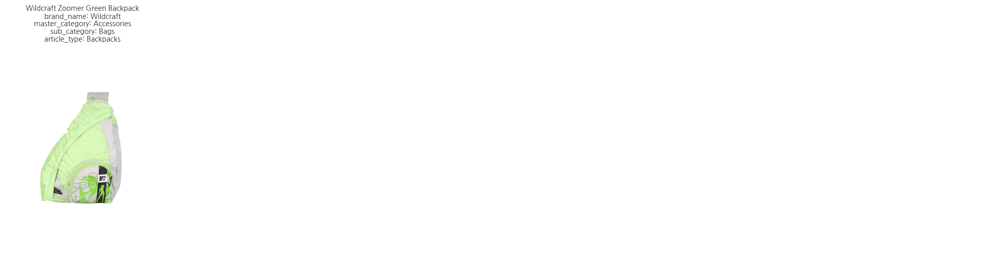

In [8]:
# 질의 아이템 제목 조회
item_id = item_id_maps[item_idx]

print(f"Item ID: {item_id}")

show_items(
    item_ids=[item_id], df_item=df_item, image_dir=paths.dataset_dir.joinpath("images")
)

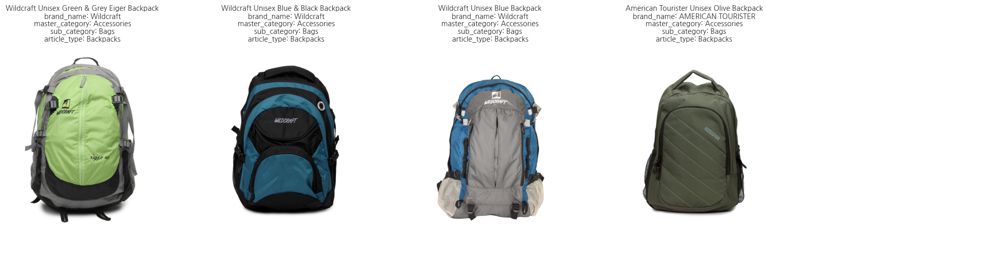

In [9]:
# 유사 아이템 제목 조회
similar_indies = list(result.keys())[1:]  # 첫 번째는 자기 자신과의 유사도이므로 제외
similar_item_ids = [item_id_maps[i] for i in similar_indies]

show_items(
    item_ids=similar_item_ids,
    df_item=df_item,
    image_dir=paths.dataset_dir.joinpath("images"),
)

# Recommendation
- User to Item 추천

In [10]:
# 질의 유저 선택
user_idx = 0
query_vector = user_vectors[user_idx]

# 아이템 벡터 인덱스에 질의한 결과 획득
result = search(query_vector, item_index, top_k=30)

# 추천 아이템 ID (원본 ID가 아닌 별도의 인덱스)
item_indies = list(result.keys())

# 추천 아이템 ID 재매핑
recommendation = {}
for i in item_indies:
    # 원본 ID로 매핑
    item_id = item_id_maps[i]
    recommendation[item_id] = result[i]

recommendation

{4826: 0.5884348154067993,
 3317: 0.5850151777267456,
 1401: 0.5584375262260437,
 4705: 0.554171085357666,
 8308: 0.5431932210922241,
 7442: 0.5364468097686768,
 2858: 0.5263727903366089,
 7514: 0.5210217833518982,
 3421: 0.5001421570777893,
 9240: 0.48373943567276,
 1175: 0.4680255651473999,
 1574: 0.46414732933044434,
 1778: 0.4491390585899353,
 1019: 0.4438017010688782,
 8391: 0.4381732940673828,
 3062: 0.4362034797668457,
 4441: 0.4312556982040405,
 8289: 0.4273691177368164,
 9018: 0.423677921295166,
 5925: 0.42215192317962646,
 5195: 0.42090362310409546,
 1043: 0.417275071144104,
 1317: 0.4162278175354004,
 2821: 0.4129341244697571,
 4132: 0.4083249568939209,
 1397: 0.4074243903160095,
 2014: 0.4015752077102661,
 2672: 0.4014371633529663,
 5920: 0.398578405380249,
 2586: 0.39277827739715576}

In [11]:
# 추천 아이템 상세 보기
df_recommendation = df_item[
    df_item["item_id"].isin(list(recommendation.keys()))
].reset_index(drop=True)

# 추천 아이템 점수(유사도) 추가
df_recommendation["score"] = df_recommendation["item_id"].map(recommendation)

# 점수별 내림차순 정렬
df_recommendation = df_recommendation.sort_values(
    "score", ascending=False, ignore_index=True
)

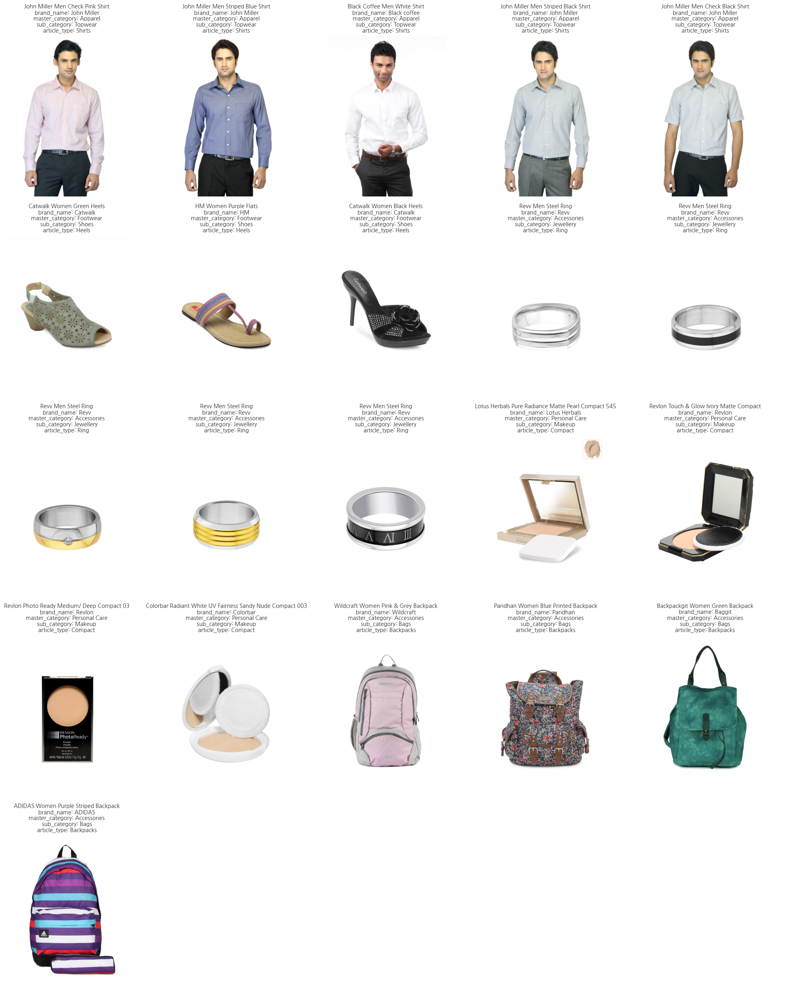

In [12]:
# 해당 유저의 히스토리 조회
item_ids = df_user_logs[df_user_logs["user_id"] == user_id_maps[user_idx]][
    "item_id"
].tolist()
show_items(
    item_ids=item_ids, df_item=df_item, image_dir=paths.dataset_dir.joinpath("images")
)

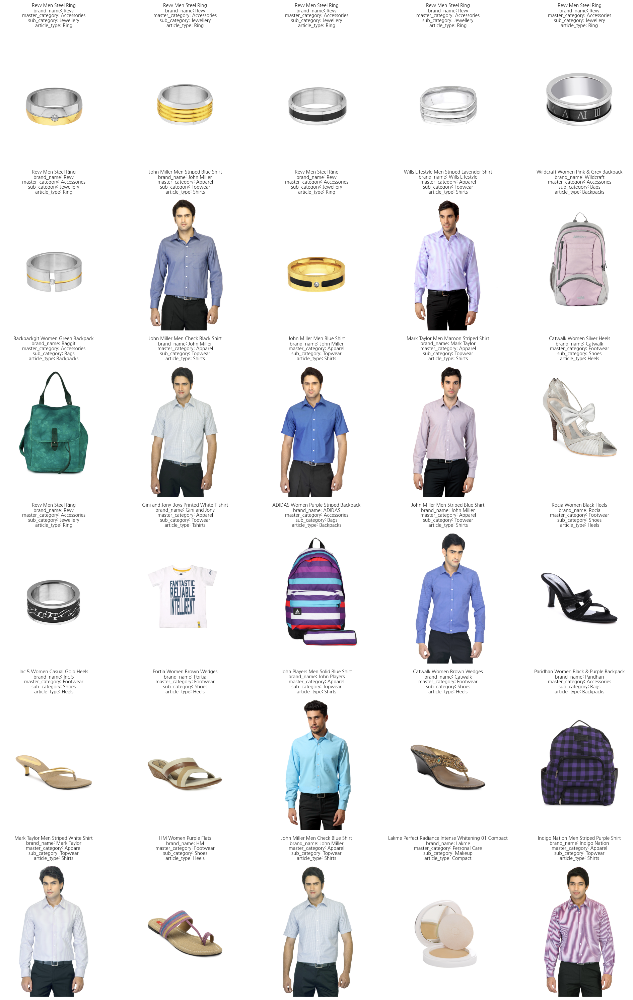

In [13]:
# 추천 아이템 최종 후보군 조회
show_items(
    item_ids=df_recommendation["item_id"].tolist(),
    df_item=df_item,
    image_dir=paths.dataset_dir.joinpath("images"),
)

# Model Registry

In [14]:
bento_model = register_artifact_model(
    model_dir=vector_path,
    name="lightgcn",
    api_version="v1",
    metadata={"domain": "fashion", "description": "LightGCN model artifact"},
)